Loaded 647 images
92 duplicate groups | 111 images removed as duplicates


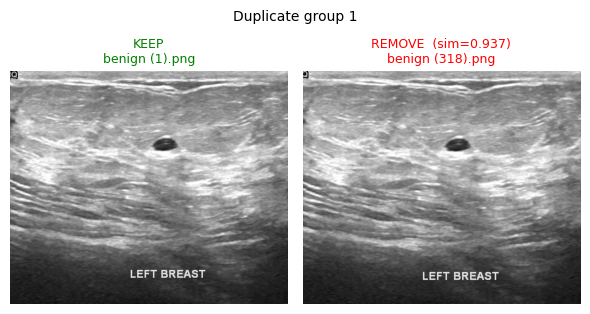

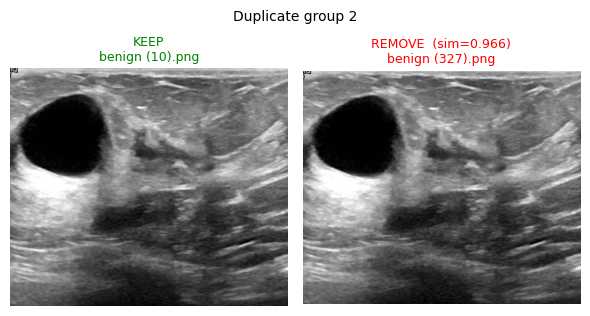

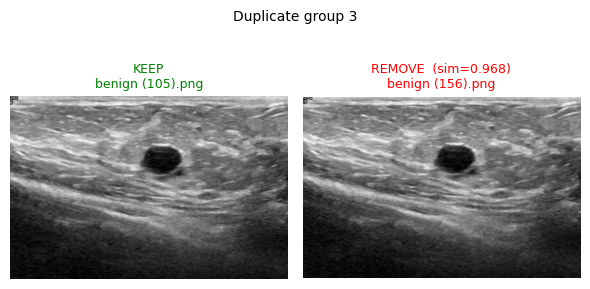

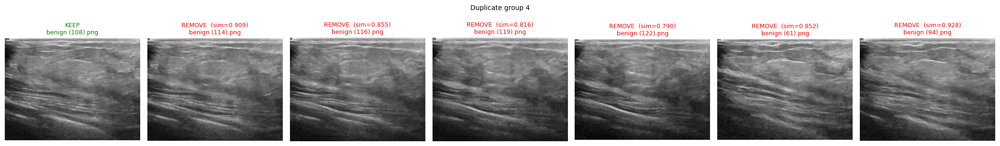

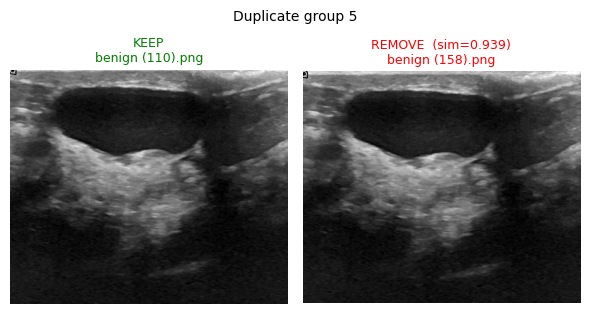

...

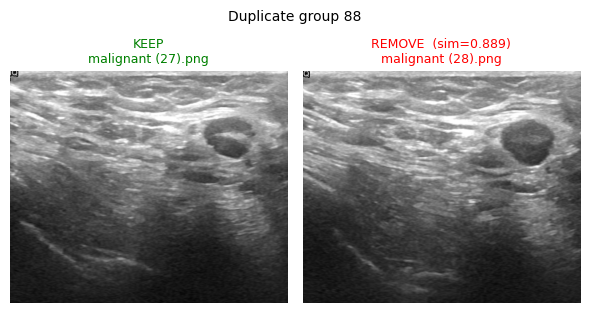

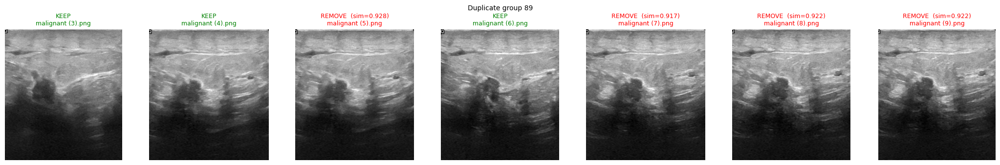

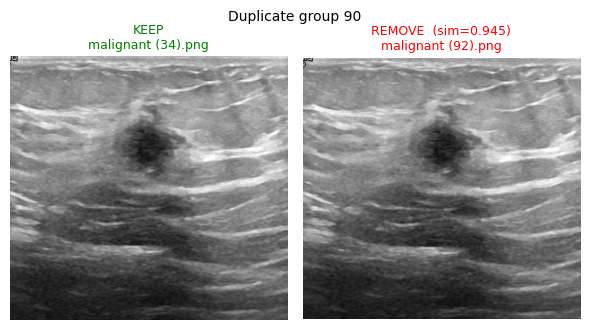

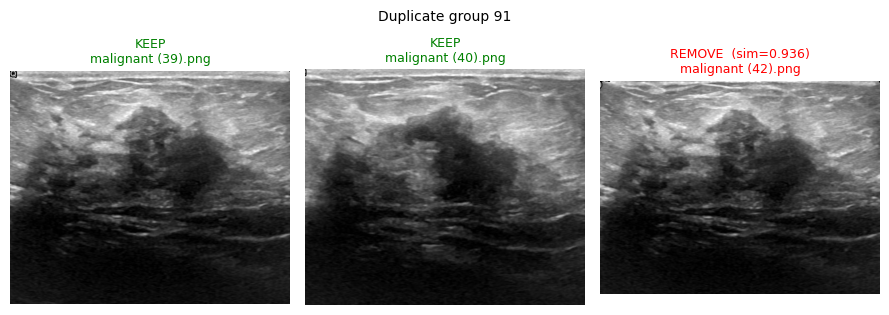

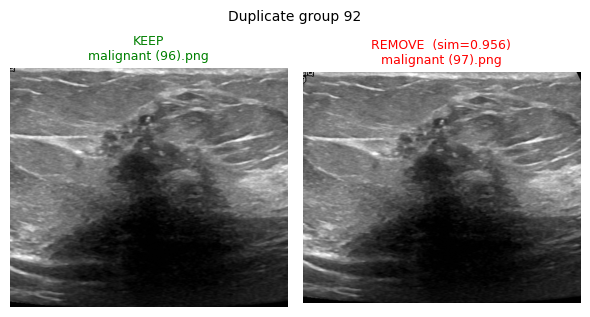

In [11]:
# ============================================================
# STANDALONE: view duplicate images being removed
# Set BUSI_ROOT, then run. Needs: numpy, opencv-python, matplotlib, pillow
# ============================================================
import os, glob
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

BUSI_ROOT = "/Users/mariyamafnan/Documents/MVI/Dataset_BUSI_with_GT"   # <-- set this
CLASSES   = ['benign', 'malignant']
THRESH    = 0.886

def robust_imread_gray(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is not None: return img
    return np.array(Image.open(path).convert('L'))

# ---- collect image paths ----
paths = []
for cls in CLASSES:
    for p in sorted(glob.glob(os.path.join(BUSI_ROOT, cls, '*.png'))):
        if '_mask' not in os.path.basename(p):
            paths.append(p)
names   = [os.path.basename(p) for p in paths]
path_of = {n: p for n, p in zip(names, paths)}
idx_of  = {n: i for i, n in enumerate(names)}
print(f"Loaded {len(names)} images")

# ---- similarity matrix ----
vecs = []
for p in paths:
    im = cv2.resize(robust_imread_gray(p), (64, 64)).astype(np.float32)
    im = (im - im.mean()) / (im.std() + 1e-6)
    vecs.append(im.flatten())
mat = np.stack(vecs); mat = mat / (np.linalg.norm(mat, axis=1, keepdims=True) + 1e-6)
sim = mat @ mat.T

# ---- manual overrides ----
MANUAL_DUP = [
    ("benign (201).png", "benign (302).png"),
    ("malignant (7).png", "malignant (8).png"),
    ("malignant (8).png", "malignant (9).png"),
    ("benign (64).png", "benign (141).png"),
]
MANUAL_KEEP = [
    ("malignant (3).png", "malignant (7).png"),
    ("malignant (24).png", "malignant (25).png"),
]
# images wrongly flagged as duplicates by the threshold — force-keep them
FORCE_KEEP = {
    "malignant (50).png", "malignant (72).png",
    "malignant (40).png", "malignant (6).png",
    "benign (435).png", "malignant (4).png"                          # <-- added: distinct from 433/145
}

# ---- union-find dedup ----
keep_apart = {frozenset(p) for p in MANUAL_KEEP}
parent = {n: n for n in names}
def find(x):
    while parent[x] != x: parent[x] = parent[parent[x]]; x = parent[x]
    return x
def union(a, b):
    if a in parent and b in parent: parent[find(a)] = find(b)
for i in range(len(names)):
    for j in range(i+1, len(names)):
        if sim[i, j] > THRESH and frozenset({names[i], names[j]}) not in keep_apart:
            union(names[i], names[j])
for a, b in MANUAL_DUP: union(a, b)

groups = {}
for n in names: groups.setdefault(find(n), []).append(n)
keep = {sorted(g)[0] for g in groups.values()} | FORCE_KEEP
dup_groups = [sorted(g) for g in groups.values() if len(g) > 1]

# ============================================================
# show each duplicate group: green = KEEP, red = REMOVE
# ============================================================
removed = sum(1 for g in dup_groups for nm in g if nm not in keep)
print(f"{len(dup_groups)} duplicate groups | {removed} images removed as duplicates\n")

for gi, grp in enumerate(dup_groups, 1):
    kept_reps = [x for x in grp if x in keep]
    ref = kept_reps[0] if kept_reps else grp[0]
    fig, axes = plt.subplots(1, len(grp), figsize=(3*len(grp), 3.4))
    if len(grp) == 1: axes = [axes]
    for ax, nm in zip(axes, grp):
        ax.imshow(robust_imread_gray(path_of[nm]), cmap='gray'); ax.axis('off')
        if nm in keep:
            ax.set_title(f"KEEP\n{nm}", color='green', fontsize=9)
        else:
            s = sim[idx_of[ref], idx_of[nm]]
            ax.set_title(f"REMOVE  (sim={s:.3f})\n{nm}", color='red', fontsize=9)
    fig.suptitle(f"Duplicate group {gi}", fontsize=10)
    plt.tight_layout(); plt.show()